<a href="https://colab.research.google.com/github/kzhao14/cs598ps_style_trasnfer/blob/main/styletransfer.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Licnese from https://github.com/clovaai/WCT2 \
"Copyright (c) 2019 NAVER Corp.

Permission is hereby granted, free of charge, to any person obtaining a copy of this software and associated documentation files (the "Software"), to deal in the Software without restriction, including without limitation the rights to use, copy, modify, merge, publish, distribute, sublicense, and/or sell copies of the Software, and to permit persons to whom the Software is furnished to do so, subject to the following conditions:

The above copyright notice and this permission notice shall be included in all copies or substantial portions of the Software.

THE SOFTWARE IS PROVIDED "AS IS", WITHOUT WARRANTY OF ANY KIND, EXPRESS OR IMPLIED, INCLUDING BUT NOT LIMITED TO THE WARRANTIES OF MERCHANTABILITY, FITNESS FOR A PARTICULAR PURPOSE AND NONINFRINGEMENT. IN NO EVENT SHALL THE AUTHORS OR COPYRIGHT HOLDERS BE LIABLE FOR ANY CLAIM, DAMAGES OR OTHER LIABILITY, WHETHER IN AN ACTION OF CONTRACT, TORT OR OTHERWISE, ARISING FROM, OUT OF OR IN CONNECTION WITH THE SOFTWARE OR THE USE OR OTHER DEALINGS IN THE SOFTWARE."


# Setup 

In [1]:
## library
!pip install --upgrade librosa
import os
import glob
import numpy as np
import torch
import torch.nn as nn
import torch.utils.data as data
import torch.nn.functional as F
import torch.optim as optim
import cv2
import copy
import librosa
from collections import defaultdict
from google.colab.patches import cv2_imshow
from torchvision import transforms
from torchvision import models
from PIL import Image
from tqdm import tqdm
from google.colab import drive
import argparse
from torchvision.utils import save_image
from IPython.display import Audio, display
import soundfile as sf
import matplotlib.pyplot as plt
import matplotlib
%matplotlib inline


     |████████████████████████████████| 184kB 7.7MB/s 
     |████████████████████████████████| 61kB 6.5MB/s 
  Created wheel for librosa: filename=librosa-0.8.0-cp36-none-any.whl size=201375 sha256=c1a7907ecb67d846558bc61f74a34fd81f42f1048aa4a0433241696237a214aa
  Stored in directory: /root/.cache/pip/wheels/ee/10/1e/382bb4369e189938d5c02e06d10c651817da8d485bfd1647c9
Successfully built librosa
  Found existing installation: librosa 0.6.3
    Uninstalling librosa-0.6.3:
      Successfully uninstalled librosa-0.6.3


In [2]:
BASE_DIR = '/content/gdrive/My Drive/CS598PS_Project/'
TRAIN_DIR = os.path.join(BASE_DIR, 'dataset/coco/train2017')
VAL_DIR = os.path.join(BASE_DIR, 'dataset/coco/val2017')
TEST_DIR = os.path.join(BASE_DIR, 'dataset/coco/test2017')

BATCH_SIZE = 16

In [3]:
drive.mount('/content/gdrive/')

Mounted at /content/gdrive/


In [4]:
os.chdir(BASE_DIR)

# COCO Dataset

In [82]:
def list_chunks(lst, n):
    """Yield successive n-sized chunks from lst."""
    for i in range(0, len(lst), n):
        yield lst[i:i + n]

def divide_image_dir(img_names, origin_path, target_path, chunk_size=5000):
  chunks = list(list_chunks(img_names, chunk_size))
  digits = len(str(len(chunks)))

  for i, chunk in enumerate(chunks):
    subdir = os.path.join(target_path, '{:0{digits}d}'.format(i, digits=digits))
    os.makedirs(subdir, exist_ok=True)
    for img_name in tqdm(chunk, position=0, leave=True):
      img_path_src = os.path.join(origin_path, img_name)
      img_path_tgt = os.path.join(subdir, img_name)
      os.rename(img_path_src, img_path_tgt)

In [83]:
'''
# Script to download COCO data to Google Drive and partition into 5000-image chunks

os.chdir('/content/')

!wget http://images.cocodataset.org/zips/val2017.zip

!unzip -q val2017.zip -d .
!rm val2017.zip

val_imgs = os.listdir('/content/val2017')
divide_image_dir(val_imgs, '/content/val2017', '/content/val2017_imgs')

!tar -cf val2017_imgs.tar ./val2017_imgs/
!rsync --info=progress2 val2017_imgs.tar "gdrive/My Drive/CS598PS_Project/dataset/coco/"

os.chdir(os.path.join(BASE_DIR, 'dataset/coco'))

!tar -xf val2017_imgs.tar
!mv val2017_imgs val2017
'''

'\n# Script to download COCO data to Google Drive and partition into 5000-image chunks\n\nos.chdir(\'/content/\')\n\n!wget http://images.cocodataset.org/zips/val2017.zip\n\n!unzip -q val2017.zip -d .\n!rm val2017.zip\n\nval_imgs = os.listdir(\'/content/val2017\')\ndivide_image_dir(val_imgs, \'/content/val2017\', \'/content/val2017_imgs\')\n\n!tar -cf val2017_imgs.tar ./val2017_imgs/\n!rsync --info=progress2 val2017_imgs.tar "gdrive/My Drive/CS598PS_Project/dataset/coco/"\n\nos.chdir(os.path.join(BASE_DIR, \'dataset/coco\'))\n\n!tar -xf val2017_imgs.tar\n!mv val2017_imgs val2017\n'

In [84]:
def preprocess(img, n=224):
  '''
  Take in an PIL image and resize it to n x n.
  '''
  crop_dim = min(img.width, img.height)
  
  left = (img.width - crop_dim) // 2
  upper = (img.height - crop_dim) // 2
  right = left + crop_dim
  lower = upper + crop_dim

  im_crop = img.crop((left, upper, right, lower))

  return im_crop.resize((n, n))

transform = transforms.Compose([
    preprocess,
    transforms.ToTensor()
])

In [85]:
class CocoDataset(data.Dataset):
    """Adapted from torchvision.datasets.coco.CocoDetection to avoid IO dragdown caused
    by a large number of files in the same directory on Google Drive. Images on Google Drive
    were saved as {img_dir}/{partition}/{image_id}.jpg, where each partition contains 5000
    images.

    Args:
      root (string): Root directory where images are downloaded to.
      transform (callable, optional): A function/transform that  takes in an PIL image
          and returns a transformed version. E.g, ``transforms.ToTensor``
    """

    def __init__(self, root, transform=None):
      self.root = root
      self.transform = transform

      self._build_img_path_lookup()

    def _build_img_path_lookup(self):
      img_paths = glob.glob(os.path.join(self.root, '*/*'))

      self.ids = []
      self.img_lookup = {}
      
      for img_path in img_paths:
        splits = img_path.split('/')
        img_name = splits[-1]
        parition = splits[-2]

        self.ids.append(img_name)
        self.img_lookup[img_name] = parition

    def _get_img_partition(self, img_name):
      return self.img_lookup[img_name]

    def __getitem__(self, index):
      """
      Args:
        index (int): Index

      Returns:
        Tensor: image
      """
      img_id = self.ids[index]
      partition = self._get_img_partition(img_id)

      img = Image.open(os.path.join(self.root, partition, img_id)).convert('RGB')
      if self.transform is not None:
        img = self.transform(img)

      return img

    def __len__(self):
      return len(self.ids)

    def __repr__(self):
      fmt_str = 'Dataset ' + self.__class__.__name__ + '\n'
      fmt_str += '    Number of datapoints: {}\n'.format(self.__len__())
      fmt_str += '    Root Location: {}\n'.format(self.root)
      tmp = '    Transforms (if any): '
      fmt_str += '{0}{1}\n'.format(tmp, self.transform.__repr__().replace('\n', '\n' + ' ' * len(tmp)))
      tmp = '    Target Transforms (if any): '
      fmt_str += '{0}{1}'.format(tmp, self.target_transform.__repr__().replace('\n', '\n' + ' ' * len(tmp)))
      return fmt_str

In [86]:
coco_train = CocoDataset(TRAIN_DIR, transform)
coco_val = CocoDataset(VAL_DIR, transform)
coco_test = CocoDataset(TEST_DIR, transform)

In [87]:
#train_idx = [x for x in range(len(coco_train)//100)]
#val_idx = [x for x in range(len(coco_val)//100)]
#test_idx = [x for x in range(len(coco_test)//100)]

train_loader = torch.utils.data.DataLoader(coco_train, batch_size=BATCH_SIZE, num_workers=16)#, sampler=data.SubsetRandomSampler(train_idx))
val_loader = torch.utils.data.DataLoader(coco_val, batch_size=BATCH_SIZE, num_workers=16)#, sampler=data.SubsetRandomSampler(val_idx))
test_loader = torch.utils.data.DataLoader(coco_test, batch_size=BATCH_SIZE, num_workers=16)#, sampler=data.SubsetRandomSampler(test_idx))

# Pool module
kzhao14

In [5]:
### kzhao14
## Pool module
def get_wav(in_channels, pool=True):
    harr_wav_L = 1 / np.sqrt(2) * np.array([[1,1]])
    harr_wav_H = 1 / np.sqrt(2) * np.array([[-1,1]])
    
    harr_wav_LL = np.transpose(harr_wav_L) * harr_wav_L
    harr_wav_LH = np.transpose(harr_wav_L) * harr_wav_H
    harr_wav_HL = np.transpose(harr_wav_H) * harr_wav_L
    harr_wav_HH = np.transpose(harr_wav_H) * harr_wav_H

    filter_LL = torch.from_numpy(harr_wav_LL).unsqueeze(0)
    filter_LH = torch.from_numpy(harr_wav_LH).unsqueeze(0)
    filter_HL = torch.from_numpy(harr_wav_HL).unsqueeze(0)
    filter_HH = torch.from_numpy(harr_wav_HH).unsqueeze(0)

    if pool:
        LL = nn.Conv2d(in_channels, in_channels,
                       kernel_size=2, stride=2, padding=0, bias=False,
                       groups=in_channels)
        
        LH = nn.Conv2d(in_channels, in_channels,
                       kernel_size=2, stride=2, padding=0, bias=False,
                       groups=in_channels)
        
        HL = nn.Conv2d(in_channels, in_channels,
                       kernel_size=2, stride=2, padding=0, bias=False,
                       groups=in_channels)
        
        HH = nn.Conv2d(in_channels, in_channels,
                       kernel_size=2, stride=2, padding=0, bias=False,
                       groups=in_channels)
    else:
        LL = nn.ConvTranspose2d(in_channels, in_channels,
                       kernel_size=2, stride=2, padding=0, bias=False,
                       groups=in_channels)
        
        LH = nn.ConvTranspose2d(in_channels, in_channels,
                       kernel_size=2, stride=2, padding=0, bias=False,
                       groups=in_channels)
        
        HL = nn.ConvTranspose2d(in_channels, in_channels,
                       kernel_size=2, stride=2, padding=0, bias=False,
                       groups=in_channels)
        
        HH = nn.ConvTranspose2d(in_channels, in_channels,
                       kernel_size=2, stride=2, padding=0, bias=False,
                       groups=in_channels)   


    LL.weight.requires_grad = False
    LH.weight.requires_grad = False
    HL.weight.requires_grad = False
    HH.weight.requires_grad = False

    LL.weight.data = filter_LL.float().unsqueeze(0).expand(in_channels, -1, -1, -1).clone()
    LH.weight.data = filter_LH.float().unsqueeze(0).expand(in_channels, -1, -1, -1).clone()
    HL.weight.data = filter_HL.float().unsqueeze(0).expand(in_channels, -1, -1, -1).clone()
    HH.weight.data = filter_HH.float().unsqueeze(0).expand(in_channels, -1, -1, -1).clone()
    
    return LL, LH, HL, HH
    
class WavePool(nn.Module):
    def __init__(self, in_channels):
        super(WavePool, self).__init__()
        self.LL, self.LH, self.HL, self.HH = get_wav(in_channels)
    
    def forward(self, x):
        return self.LL(x), self.LH(x), self.HL(x), self.HH(x)
        

class WaveUnpool(nn.Module):
    def __init__(self, in_channels):
        super(WaveUnpool, self).__init__()
        self.in_channels = in_channels
        self.LL, self.LH, self.HL, self.HH = get_wav(self.in_channels, pool=False)

    def forward(self, LL, LH, HL, HH, original):
        if original is not None:
            return torch.cat([self.LL(LL), self.LH(LH), self.HL(HL), self.HH(HH), original], dim=1)
        else:
            raise NotImplementedError

    


# Encoder
tianyus2

In [6]:
### tianyus2
class WaveEncoder(nn.Module):
    def __init__(self):
        super(WaveEncoder, self).__init__()

        self.pad = nn.ReflectionPad2d(1)
        self.relu = nn.ReLU(inplace=True)

        self.conv0 = nn.Conv2d(3, 3, 1, 1, 0)
        self.conv1_1 = nn.Conv2d(3, 64, 3, 1, 0)
        self.conv1_2 = nn.Conv2d(64, 64, 3, 1, 0)
        self.pool1 = WavePool(64)

        self.conv2_1 = nn.Conv2d(64, 128, 3, 1, 0)
        self.conv2_2 = nn.Conv2d(128, 128, 3, 1, 0)
        self.pool2 = WavePool(128)

        self.conv3_1 = nn.Conv2d(128, 256, 3, 1, 0)
        self.conv3_2 = nn.Conv2d(256, 256, 3, 1, 0)
        self.conv3_3 = nn.Conv2d(256, 256, 3, 1, 0)
        self.conv3_4 = nn.Conv2d(256, 256, 3, 1, 0)
        self.pool3 = WavePool(256)

        self.conv4_1 = nn.Conv2d(256, 512, 3, 1, 0)

    def forward(self, x):
        skips = {}
        for level in [1, 2, 3, 4]:
            x = self.encode(x, skips, level)
        return x

    def encode(self, x, skips, level):
        assert level in {1, 2, 3, 4}
        if level == 1:
            out = self.conv0(x)
            out = self.relu(self.conv1_1(self.pad(out)))
            return out

        elif level == 2:
            out = self.relu(self.conv1_2(self.pad(x)))
            skips['conv1_2'] = out
            LL, LH, HL, HH = self.pool1(out)
            skips['pool1'] = [LH, HL, HH]
            out = self.relu(self.conv2_1(self.pad(LL)))
            return out

        elif level == 3:
            out = self.relu(self.conv2_2(self.pad(x)))
            skips['conv2_2'] = out
            LL, LH, HL, HH = self.pool2(out)
            skips['pool2'] = [LH, HL, HH]
            out = self.relu(self.conv3_1(self.pad(LL)))
            return out

        else:
            out = self.relu(self.conv3_2(self.pad(x)))
            out = self.relu(self.conv3_3(self.pad(out)))
            out = self.relu(self.conv3_4(self.pad(out)))
            skips['conv3_4'] = out
            LL, LH, HL, HH = self.pool3(out)
            skips['pool3'] = [LH, HL, HH]
            out = self.relu(self.conv4_1(self.pad(LL)))
            return out

# Decoder
yashuow2

In [7]:
### yashuow2
class WaveDecoder(nn.Module):
    def __init__(self):
        super(WaveDecoder, self).__init__()

        self.pad = nn.ReflectionPad2d(1)
        self.relu = nn.ReLU(inplace=True)

        # mirror structure of encoder
        self.conv4_1 = nn.Conv2d(512, 256, 3, 1, 0)

        self.recon_block3 = WaveUnpool(256)

        self.conv3_4_2 = nn.Conv2d(256*5, 256, 3, 1, 0)
        self.conv3_3 = nn.Conv2d(256, 256, 3, 1, 0)
        self.conv3_2 = nn.Conv2d(256, 256, 3, 1, 0)
        self.conv3_1 = nn.Conv2d(256, 128, 3, 1, 0)

        self.recon_block2 = WaveUnpool(128)

        self.conv2_2_2 = nn.Conv2d(128*5, 128, 3, 1, 0)
        self.conv2_1 = nn.Conv2d(128, 64, 3, 1, 0)

        self.recon_block1 = WaveUnpool(64)

        self.conv1_2_2 = nn.Conv2d(64*5, 64, 3, 1, 0)
        self.conv1_1 = nn.Conv2d(64, 3, 3, 1, 0)

    def forward(self, x, skips):
        for level in [4, 3, 2, 1]:
            x = self.decode(x, skips, level)
        return x

    def decode(self, x, skips, level):
        assert level in {4,3,2,1}
        if level == 4:
            out = self.relu(self.conv4_1(self.pad(x)))
            LH, HL, HH = skips['pool3']
            original = skips['conv3_4'] if 'conv3_4' in skips.keys() else None
            out = self.recon_block3(out, LH, HL, HH, original)
            out = self.relu(self.conv3_4_2(self.pad(out)))             
            out = self.relu(self.conv3_3(self.pad(out)))
            return self.relu(self.conv3_2(self.pad(out)))
        elif level == 3:
            out = self.relu(self.conv3_1(self.pad(x)))
            LH, HL, HH = skips['pool2']
            original = skips['conv2_2'] if 'conv2_2' in skips.keys() else None
            out = self.recon_block2(out, LH, HL, HH, original)
            return self.relu(self.conv2_2_2(self.pad(out)))
        elif level == 2:
            out = self.relu(self.conv2_1(self.pad(x)))
            LH, HL, HH = skips['pool1']
            original = skips['conv1_2'] if 'conv1_2' in skips.keys() else None
            out = self.recon_block1(out, LH, HL, HH, original)
            return self.relu(self.conv1_2_2(self.pad(out)))
        else:
            return self.conv1_1(self.pad(x))


# Training Module


In [8]:
# https://pytorch.org/tutorials/advanced/neural_style_tutorial.html
def Gram_matrix(input):
    a, b, c, d = input.size()  # a=batch size(=1)
    # b=number of feature maps
    # (c,d)=dimensions of a f. map (N=c*d)

    features = input.view(a * b, c * d)  # resise F_XL into \hat F_XL

    G = torch.mm(features, features.t())  # compute the gram product

    # we 'normalize' the values of the gram matrix
    # by dividing by the number of element in each feature maps.
    return torch.sum(G.div(a * b * c * d))


def Train(encoder, decoder, optimizer, sampler=False, num_epoches=32):
    
    
    best_model_wts = copy.deepcopy(decoder.state_dict())

    best_loss = float('inf')

    for epoch in tqdm(range(num_epoches), total = num_epoches):
        for phase in ['train', 'val']:
            if phase == 'train':
                decoder.train()
                dataloader = train_loader
                nsample = len(train_loader.sampler)
            else:
                decoder.eval()
                dataloader = val_loader
                nsample = len(val_loader.sampler)

            running_loss = 0.0
            
            for images in dataloader:
                images = images.cuda()

                optimizer.zero_grad()

                # forward pass

                with torch.set_grad_enabled(phase == 'train'):
                    # skips contain features content
                    skips = {}
                    #skips = skips.cuda()
                    outputs = encoder(images, skips)
                    #print(len(skips))
                    outputs = decoder(outputs, skips)
                    
                    skips_decoder = {}
                    outputs_decoder = encoder(outputs, skips_decoder)


                    # calculate loss
                    #print(outputs.shape)
                    #print(images.shape)
                    mse = F.mse_loss(outputs, images)
                    gramloss = 0.0
                    for layer in ['conv1_2', 'conv2_2', 'conv3_4']:
                        #print("{} skips Dimesion: {} skips_decoder Dimension: {}".format(layer, skips[layer].shape, skips_decoder[layer].shape))
                        gramloss += Gram_matrix(skips[layer]) - Gram_matrix(skips_decoder[layer])

                    # average between the 3 layers
                    gramloss = gramloss / 3.0


                    loss = mse + gramloss
                    #print(mse)
                    if phase == 'train':
                        loss.backward()
                        optimizer.step()

                running_loss += loss.item() * images.size(0)

            epoch_loss = running_loss / nsample

            if phase == 'val':
                if epoch_loss < best_loss:
                    best_loss = epoch_loss
                    best_model_wts = copy.deepcopy(decoder.state_dict())
                    torch.save(decoder.state_dict(), "decoder_wts.pt")

    print('Best val loss: {:4f}'.format(best_loss))

    decoder.load_state_dict(best_model_wts)

    return decoder

def Test(encoder, decoder, criterion):
    nsample = len(test_loader.dataset)
    running_loss = 0.0


    # Iterrate over data.
    for images in test_dataloader:

        images = images.cuda()

        # forward pass

        outputs = decoder(encoder(images))

        loss = criterion(outputs, images)


        # Statistics
        running_loss += loss.item() * images.size(0)

        
    # Total loss
    total_loss = running_loss / nsample

    print('Test Loss: {:.4f}'.format(total_loss))



def GetVGG19():
    vgg19 = models.vgg19(pretrained=True)

    pytorch_total_params = sum(p.numel() for p in vgg19.parameters())

    return vgg19

def TransferWeight(encoder):
    # Download weigth for vgg
    model = GetVGG19()

    # Copy over the weight to encoder
    encoder.conv1_1.weight.data = model.features[0].weight.data
    encoder.conv1_2.weight.data = model.features[2].weight.data
    encoder.conv2_1.weight.data = model.features[5].weight.data
    encoder.conv2_2.weight.data = model.features[7].weight.data
    encoder.conv3_1.weight.data = model.features[10].weight.data
    encoder.conv3_2.weight.data = model.features[12].weight.data
    encoder.conv3_3.weight.data = model.features[14].weight.data
    encoder.conv3_4.weight.data = model.features[16].weight.data
    encoder.conv4_1.weight.data = model.features[19].weight.data

    # freeze the parameters in encoder
    for param in encoder.parameters():
        param.requires_grad = False
    
    return encoder


def GetWeightTemp(encoder, decoder):

    encoder.load_state_dict(torch.load("src/model_checkpoints/wave_encoder_cat5_l4.pth"))
    decoder.load_state_dict(torch.load("src/model_checkpoints/wave_decoder_cat5_l4.pth"))

    return encoder, decoder

In [9]:
class WavePool(nn.Module):
    def __init__(self, in_channels):
        super(WavePool, self).__init__()
        self.LL, self.LH, self.HL, self.HH = get_wav(in_channels)

    def forward(self, x):
        return self.LL(x), self.LH(x), self.HL(x), self.HH(x)


class WaveUnpool(nn.Module):
    def __init__(self, in_channels, option_unpool='cat5'):
        super(WaveUnpool, self).__init__()
        self.in_channels = in_channels
        self.option_unpool = option_unpool
        self.LL, self.LH, self.HL, self.HH = get_wav(self.in_channels, pool=False)

    def forward(self, LL, LH, HL, HH, original=None):
        if self.option_unpool == 'sum':
            return self.LL(LL) + self.LH(LH) + self.HL(HL) + self.HH(HH)
        elif self.option_unpool == 'cat5' and original is not None:
            return torch.cat([self.LL(LL), self.LH(LH), self.HL(HL), self.HH(HH), original], dim=1)
        else:
            raise NotImplementedError

# Utilities

In [10]:
"""
from photo_wct.py of https://github.com/NVIDIA/FastPhotoStyle
Copyright (C) 2018 NVIDIA Corporation.
Licensed under the CC BY-NC-SA 4.0
"""
import torch
import numpy as np
from PIL import Image


def svd(feat, iden=False, device='cpu'):
    size = feat.size()
    mean = torch.mean(feat, 1)
    mean = mean.unsqueeze(1).expand_as(feat)
    _feat = feat.clone()
    _feat -= mean
    if size[1] > 1:
        conv = torch.mm(_feat, _feat.t()).div(size[1] - 1)
    else:
        conv = torch.mm(_feat, _feat.t())
    if iden:
        conv += torch.eye(size[0]).to(device)
    u, e, v = torch.svd(conv, some=False)
    return u, e, v


def get_squeeze_feat(feat):
    _feat = feat.squeeze(0)
    size = _feat.size(0)
    return _feat.view(size, -1).clone()


def get_rank(singular_values, dim, eps=0.00001):
    r = dim
    for i in range(dim - 1, -1, -1):
        if singular_values[i] >= eps:
            r = i + 1
            break
    return r


def wct_core(cont_feat, styl_feat, weight=1, registers=None, device='cpu'):
    cont_feat = get_squeeze_feat(cont_feat)
    cont_min = cont_feat.min()
    cont_max = cont_feat.max()
    cont_mean = torch.mean(cont_feat, 1).unsqueeze(1).expand_as(cont_feat)
    cont_feat -= cont_mean

    if not registers:
        _, c_e, c_v = svd(cont_feat, iden=True, device=device)

        styl_feat = get_squeeze_feat(styl_feat)
        s_mean = torch.mean(styl_feat, 1)
        _, s_e, s_v = svd(styl_feat, iden=True, device=device)
        k_s = get_rank(s_e, styl_feat.size()[0])
        s_d = (s_e[0:k_s]).pow(0.5)
        EDE = torch.mm(torch.mm(s_v[:, 0:k_s], torch.diag(s_d) * weight), (s_v[:, 0:k_s].t()))

        if registers is not None:
            registers['EDE'] = EDE
            registers['s_mean'] = s_mean
            registers['c_v'] = c_v
            registers['c_e'] = c_e
    else:
        EDE = registers['EDE']
        s_mean = registers['s_mean']
        _, c_e, c_v = svd(cont_feat, iden=True, device=device)

    k_c = get_rank(c_e, cont_feat.size()[0])
    c_d = (c_e[0:k_c]).pow(-0.5)
    # TODO could be more fast
    step1 = torch.mm(c_v[:, 0:k_c], torch.diag(c_d))
    step2 = torch.mm(step1, (c_v[:, 0:k_c].t()))
    whiten_cF = torch.mm(step2, cont_feat)

    targetFeature = torch.mm(EDE, whiten_cF)
    targetFeature = targetFeature + s_mean.unsqueeze(1).expand_as(targetFeature)
    targetFeature.clamp_(cont_min, cont_max)

    return targetFeature


def wct_core_segment(content_feat, style_feat, content_segment, style_segment,
                     label_set, label_indicator, weight=1, registers=None,
                     device='cpu'):
    def resize(feat, target):
        size = (target.size(2), target.size(1))
        if len(feat.shape) == 2:
            return np.asarray(Image.fromarray(feat).resize(size, Image.NEAREST))
        else:
            return np.asarray(Image.fromarray(feat, mode='RGB').resize(size, Image.NEAREST))

    def get_index(feat, label):
        mask = np.where(feat.reshape(feat.shape[0] * feat.shape[1]) == label)
        if mask[0].size <= 0:
            return None
        return torch.LongTensor(mask[0]).to(device)

    squeeze_content_feat = content_feat.squeeze(0)
    squeeze_style_feat = style_feat.squeeze(0)

    content_feat_view = squeeze_content_feat.view(squeeze_content_feat.size(0), -1).clone()
    style_feat_view = squeeze_style_feat.view(squeeze_style_feat.size(0), -1).clone()

    resized_content_segment = resize(content_segment, squeeze_content_feat)
    resized_style_segment = resize(style_segment, squeeze_style_feat)

    target_feature = content_feat_view.clone()
    for label in label_set:
        if not label_indicator[label]:
            continue
        content_index = get_index(resized_content_segment, label)
        style_index = get_index(resized_style_segment, label)
        if content_index is None or style_index is None:
            continue
        masked_content_feat = torch.index_select(content_feat_view, 1, content_index)
        masked_style_feat = torch.index_select(style_feat_view, 1, style_index)
        _target_feature = wct_core(masked_content_feat, masked_style_feat, weight, registers, device=device)
        if torch.__version__ >= '0.4.0':
            # XXX reported bug in the original repository
            new_target_feature = torch.transpose(target_feature, 1, 0)
            new_target_feature.index_copy_(0, content_index,
                                           torch.transpose(_target_feature, 1, 0))
            target_feature = torch.transpose(new_target_feature, 1, 0)
        else:
            target_feature.index_copy_(1, content_index, _target_feature)
    return target_feature


def feature_wct(content_feat, style_feat, content_segment=None, style_segment=None,
                label_set=None, label_indicator=None, weight=1, registers=None, alpha=1, device='cpu'):
    if label_set is not None:
        target_feature = wct_core_segment(content_feat, style_feat, content_segment, style_segment,
                                          label_set, label_indicator, weight, registers, device=device)
    else:
        target_feature = wct_core(content_feat, style_feat, device=device)
    target_feature = target_feature.view_as(content_feat)
    target_feature = alpha * target_feature + (1 - alpha) * content_feat
    return target_feature

In [11]:
def compute_label_info(content_segment, style_segment):
    if not content_segment.size or not style_segment.size:
        return None, None
    max_label = np.max(content_segment) + 1
    label_set = np.unique(content_segment)
    label_indicator = np.zeros(max_label)
    for l in label_set:
        content_mask = np.where(content_segment.reshape(content_segment.shape[0] * content_segment.shape[1]) == l)
        style_mask = np.where(style_segment.reshape(style_segment.shape[0] * style_segment.shape[1]) == l)

        c_size = content_mask[0].size
        s_size = style_mask[0].size
        if c_size > 10 and s_size > 10 and c_size / s_size < 100 and s_size / c_size < 100:
            label_indicator[l] = True
        else:
            label_indicator[l] = False
    return label_set, label_indicator


def open_image(image_path, image_size=None):
    image = Image.open(image_path)
    _transforms = []
    if image_size is not None:
        image = transforms.Resize(image_size)(image)
        # _transforms.append(transforms.Resize(image_size))
    w, h = image.size
    _transforms.append(transforms.CenterCrop((h // 16 * 16, w // 16 * 16)))
    _transforms.append(transforms.ToTensor())
    transform = transforms.Compose(_transforms)
    return transform(image).unsqueeze(0)
    
def change_seg(seg):
    color_dict = {
        (0, 0, 255): 3,  # blue
        (0, 255, 0): 2,  # green
        (0, 0, 0): 0,  # black
        (255, 255, 255): 1,  # white
        (255, 0, 0): 4,  # red
        (255, 255, 0): 5,  # yellow
        (128, 128, 128): 6,  # grey
        (0, 255, 255): 7,  # lightblue
        (255, 0, 255): 8  # purple
    }
    arr_seg = np.asarray(seg)
    new_seg = np.zeros(arr_seg.shape[:-1])
    for x in range(arr_seg.shape[0]):
        for y in range(arr_seg.shape[1]):
            if tuple(arr_seg[x, y, :]) in color_dict:
                new_seg[x, y] = color_dict[tuple(arr_seg[x, y, :])]
            else:
                min_dist_index = 0
                min_dist = 99999
                for key in color_dict:
                    dist = np.sum(np.abs(np.asarray(key) - arr_seg[x, y, :]))
                    if dist < min_dist:
                        min_dist = dist
                        min_dist_index = color_dict[key]
                    elif dist == min_dist:
                        try:
                            min_dist_index = new_seg[x, y-1, :]
                        except Exception:
                            pass
                new_seg[x, y] = min_dist_index
    return new_seg.astype(np.uint8)

def load_segment(image_path, image_size=None):
    if not image_path:
        return np.asarray([])
    image = Image.open(image_path)
    if image_size is not None:
        transform = transforms.Resize(image_size, interpolation=Image.NEAREST)
        image = transform(image)
    w, h = image.size
    transform = transforms.CenterCrop((h // 16 * 16, w // 16 * 16))
    image = transform(image)
    if len(np.asarray(image).shape) == 3:
        image = change_seg(image)
    return np.asarray(image)

class Timer:
    def __init__(self, msg='Elapsed time: {}', verbose=True):
        self.msg = msg
        self.start_time = None
        self.verbose = verbose

    def __enter__(self):
        self.start_time = datetime.datetime.now()

    def __exit__(self, exc_type, exc_value, exc_tb):
        if self.verbose:
            print(self.msg.format(datetime.datetime.now() - self.start_time))

# Transfer

In [12]:
image_extention = ['.jpg', '.JPG', '.jpeg', '.JPEG','.png', '.PNG',]
# from google.colab import drive
# drive.mount('/utils/')
# import os
# import sys
# sys.path.append('/utils/')
# py_file_location = "/utils/"
# sys.path.append(os.path.abspath(py_file_location))

# from core import feature_wct
# from io import Timer, open_image, load_segment, compute_label_info


def is_image_file(filename):
    return any(filename.endswith(extension) for extension in IMG_EXTENSIONS)

class WCT2:
    def __init__(self, transfer_at=['encoder', 'skip', 'decoder'], device='cuda:0', verbose=False):

        self.transfer_at = set(transfer_at)

        self.device = torch.device(device)
        self.encoder = WaveEncoder().to(self.device)
        self.decoder = WaveDecoder().to(self.device)
        self.verbose = verbose
        self.encoder, self.decoder = GetWeightTemp(self.encoder, self.decoder)

    def encode(self, x, skips, level):
        return self.encoder.encode(x, skips, level)

    def decode(self, x, skips, level):
        return self.decoder.decode(x, skips, level)
        
    def get_all_feature(self, x):
        skips = {}
        feats = {'encoder': {}, 'decoder':{}}
        for level in [1,2,3,4]:
            x = self.encode(x, skips, level)
            if 'encoder' in self.transfer_at:
                feats['encoder'][level] = x
        if 'encoder' not in self.transfer_at:
            feats['decoder'][4] = x
        for level in [4, 3, 2]:
            x = self.decode(x, skips, level)
            if 'decoder' in self.transfer_at:
                feats['decoder'][level - 1] = x
        return feats, skips

    def transfer(self, content, style, content_segment, style_segment, alpha = 1):
        label_set, label_indicator = None, None #compute_label_info(content_segment,style_segment)
        content_feat, content_skips = content, {}
        style_feats, style_skips = self.get_all_feature(style)

        wct2_enc_level = [1, 2, 3, 4]
        wct2_dec_level = [1, 2, 3, 4]
        wct2_skip_level = ['pool1', 'pool2', 'pool3']
        
        for level in [1,2,3,4]:
            content_feat = self.encode(content_feat, content_skips, level)
            if 'encoder' in self.transfer_at and level in wct2_enc_level:
                content_feat = feature_wct(content_feat, style_feats['encoder'][level], 
                                           content_segment, style_segment,
                                           label_set, label_indicator,
                                           alpha=alpha, device=self.device)
                print('transfer at encoder {}'.format(level))

        if 'skip' in self.transfer_at:
            for skip_level in wct2_skip_level:
                for component in [0, 1, 2]:  # component: [LH, HL, HH]
                    content_skips[skip_level][component] = feature_wct(content_skips[skip_level][component], style_skips[skip_level][component],
                                                                        content_segment, style_segment,
                                                                        label_set, label_indicator,
                                                                        alpha=alpha, device=self.device)
                print('transfer at skip {}'.format(skip_level))
        
        for level in [4, 3, 2, 1]:
            if 'decoder' in self.transfer_at and level in style_feats['decoder'] and level in wct2_dec_level:
                content_feat = feature_wct(content_feat, style_feats['decoder'][level],
                                           content_segment, style_segment,
                                           label_set, label_indicator,
                                           alpha=alpha, device=self.device)
                print('transfer at decoder {}'.format(level))
            content_feat = self.decode(content_feat, content_skips, level)
        return content_feat

# Images

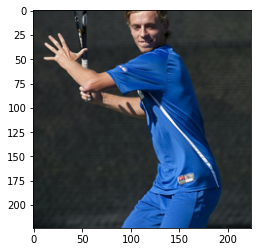

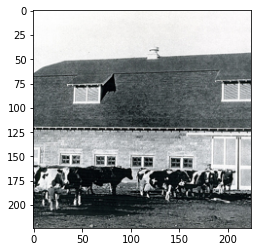

In [112]:
# content: 225
# style : 134
content_image = coco_train[225]
style_image = coco_train[4985]
plt.figure()
plt.imshow(content_image.permute(1,2,0))
plt.figure()
plt.imshow(style_image.permute(1,2,0))

In [113]:
content = content_image.unsqueeze(0).to('cuda:0')
style = style_image.unsqueeze(0).to('cuda:0')

wct2 = WCT2()
with torch.no_grad():
    img = wct2.transfer(content, style, None, None)

transfer at encoder 1
transfer at encoder 2
transfer at encoder 3
transfer at encoder 4
transfer at skip pool1
transfer at skip pool2
transfer at skip pool3
transfer at decoder 3
transfer at decoder 2
transfer at decoder 1


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


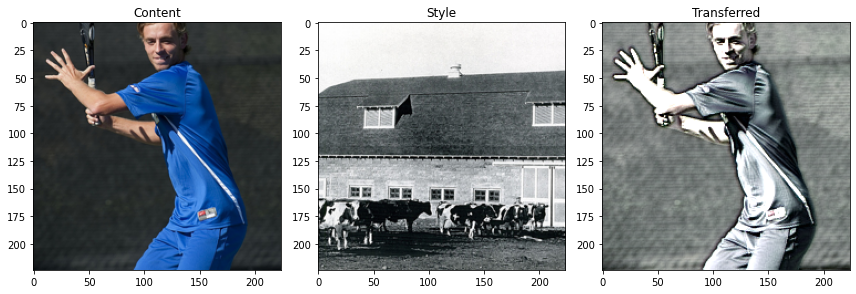

In [114]:
fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(12, 4))
ax[0].imshow(content_image.permute(1,2,0))
ax[1].imshow(style_image.permute(1,2,0))
ax[2].imshow(img[0].cpu().permute(1,2,0))

ax[0].set_title('Content')
ax[1].set_title('Style')
ax[2].set_title('Transferred')

fig.tight_layout()
plt.savefig('graphs/4.jpg')

# Audio

In [ ]:
def read_audio_spectum(filename):
    x, fs = librosa.load(filename)
    #print(fs)
    S = librosa.stft(x, N_FFT)
    p = np.angle(S)
    
    S = np.log1p(np.abs(S))  
    return S, fs

def reconstruct_audio(spectrum):
    a = np.exp(spectrum) - 1
    p = 2 * np.pi * np.random.random_sample(spectrum.shape) - np.pi
    for i in range(50):
        S = a * np.exp(1j * p)
        x = librosa.istft(S)
        p = np.angle(librosa.stft(x, N_FFT))
    return x

In [ ]:
wct2 = WCT2()

In [ ]:
N_FFT = 1024
CONTENT_FILENAME = "./dataset/audio/inputs/turkey_march.wav"
STYLE_FILENAME = "./dataset/audio/inputs/wind_chime.wav"

In [ ]:
!ls ./dataset/audio/inputs/

boy18.wav   futurama.mp3    imperial.mp3   russia.mp3	  valkyries.mp3
boy.wav     gettysburg.mp3  lemons.mp3	   spongebob.mp3
eminem.mp3  girl52.wav	    nightcall.wav  stairway.wav
fire.mp3    girl.wav	    nwa.mp3	   usa.mp3


In [ ]:
a_content, fs = read_audio_spectum(CONTENT_FILENAME)
a_style, fs = read_audio_spectum(STYLE_FILENAME)

h, w = a_content.shape
h_new, w_new = h // 16 * 16, w // 16 * 16
h_diff, w_diff = h - h_new, w - w_new

content_input = torch.from_numpy(np.repeat(a_content[np.newaxis, :h_new, :w_new], 3, axis=0)).unsqueeze(0).to('cuda:0')
style_input = torch.from_numpy(np.repeat(a_style[np.newaxis, :h_new, :w_new], 3, axis=0)).unsqueeze(0).to('cuda:0')

22050
22050


In [ ]:
with torch.no_grad():
    transferred = wct2.transfer(content_input, style_input, None, None, alpha=2)
transferred = np.mean(transferred[0].cpu().numpy(), axis=0)
# transferred = transferred[0].cpu().numpy()[2] * scale
transferred = np.pad(transferred, [(0, h_diff), (0, w_diff)])

transfer at encoder 1
transfer at encoder 2
transfer at encoder 3
transfer at encoder 4
transfer at skip pool1
transfer at skip pool2
transfer at skip pool3
transfer at decoder 3
transfer at decoder 2
transfer at decoder 1


In [ ]:
x = reconstruct_audio(transferred)
out_file = './turkey_march-wind_chime.mp3'
librosa.output.write_wav(out_file, x, fs)

In [ ]:
display(Audio(CONTENT_FILENAME))
display(Audio(STYLE_FILENAME))

In [ ]:
display(Audio(out_file))

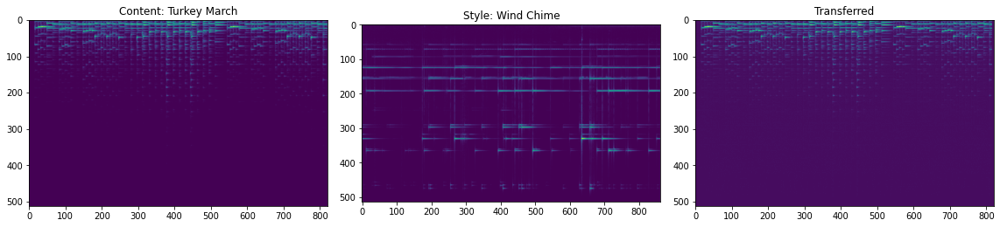

In [ ]:
fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(16, 4))

ax[0].imshow(a_content)
ax[1].imshow(a_style)
ax[2].imshow(transferred)

ax[0].set_title('Content: Turkey March')
ax[1].set_title('Style: Wind Chime')
ax[2].set_title('Transferred')

fig.tight_layout()
plt.savefig('graphs/turkey_march-wind_chime.jpg')

# Audio Mel spectrogram

In [40]:
def read_audio_mel_spectum(filename):
    #from scipy import signal
    x, fs = librosa.load(filename)


    S = librosa.stft(x, N_FFT)
    S = librosa.feature.melspectrogram(S=S, n_mels = 256)

    S= librosa.power_to_db(np.abs(S)**2)

    return S, fs

def reconstruct_audio_mel(spectrum):
    #a = np.exp(spectrum) - 1
    a = librosa.db_to_power(spectrum)
    #a = librosa.feature.inverse.mel_to_stft(a,n_fft=N_FFT)
    
    x = librosa.feature.inverse.mel_to_audio(a,n_fft=N_FFT,hop_length=N_FFT//4)
    
    #p = 2 * np.pi * np.random.random_sample(a.shape) - np.pi
    #for i in range(50):
    #    S = a * np.exp(1j * p)
    #    x = librosa.istft(S)
    #    p = np.angle(librosa.stft(x, N_FFT))
    return x

In [48]:
!ls ./dataset/audio/inputs/

boy18.wav   futurama.mp3    imperial.mp3   russia.mp3	     usa.mp3
boy.wav     gettysburg.mp3  lemons.mp3	   spongebob.mp3     valkyries.mp3
eminem.mp3  girl52.wav	    nightcall.wav  stairway.wav      wind_chime.wav
fire.mp3    girl.wav	    nwa.mp3	   turkey_march.wav


In [76]:
wct2 = WCT2()
N_FFT = 1024
CONTENT_FILENAME = "./dataset/audio/inputs/fire.mp3"
STYLE_FILENAME = "./dataset/audio/inputs/wind_chime.wav"

/usr/local/lib/python3.6/dist-packages/librosa/core/audio.py:162: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn("PySoundFile failed. Trying audioread instead.")


Text(0.5, 1.0, 'Style')

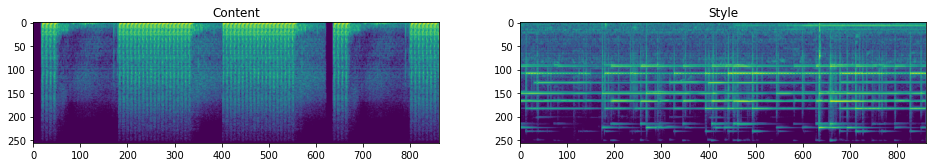

In [77]:
a_content, fs = read_audio_mel_spectum(CONTENT_FILENAME)
a_style, fs = read_audio_mel_spectum(STYLE_FILENAME)

fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(16, 6))

ax[0].imshow(a_content)
ax[1].imshow(a_style)
#ax[2].imshow(transferred)

ax[0].set_title('Content')
ax[1].set_title('Style')
#ax[2].set_title('Transferred')

In [78]:
a_content, fs = read_audio_mel_spectum(CONTENT_FILENAME)
a_style, fs = read_audio_mel_spectum(STYLE_FILENAME)
scale = min(np.min(a_content), np.min(a_style))
a_content = a_content / scale
a_style = a_style / scale

h, w = a_content.shape
h_new, w_new = h // 16 * 16, w // 16 * 16
h_diff, w_diff = h - h_new, w - w_new

content_input = torch.from_numpy(np.repeat(a_content[np.newaxis, :h_new, :w_new].astype('float32'), 3, axis=0)).unsqueeze(0).to('cuda:0')
style_input = torch.from_numpy(np.repeat(a_style[np.newaxis, :h_new, :w_new].astype('float32'), 3, axis=0)).unsqueeze(0).to('cuda:0')

/usr/local/lib/python3.6/dist-packages/librosa/core/audio.py:162: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn("PySoundFile failed. Trying audioread instead.")


In [17]:
a_content.dtype

dtype('float32')

In [79]:
with torch.no_grad():
    transferred = wct2.transfer(content_input, style_input, None, None, alpha=1)
transferred = np.mean(transferred[0].cpu().numpy(), axis=0)*scale
# transferred = transferred[0].cpu().numpy()[2] * scale
transferred = np.pad(transferred, [(0, h_diff), (0, w_diff)])

transfer at encoder 1
transfer at encoder 2
transfer at encoder 3
transfer at encoder 4
transfer at skip pool1
transfer at skip pool2
transfer at skip pool3
transfer at decoder 3
transfer at decoder 2
transfer at decoder 1


In [80]:
x = reconstruct_audio_mel(transferred)
out_file = './fire-wind_chime_mel.wav'
sf.write(out_file, x, fs)
#librosa.output.write_wav(out_file, x, fs)

In [43]:
x

array([ 3.8084785e-05,  1.5603369e-05,  8.1628223e-06, ...,
       -1.7337029e-01, -2.2684598e-01, -2.4248946e-01], dtype=float32)

In [54]:
display(Audio(CONTENT_FILENAME))
display(Audio(STYLE_FILENAME))

In [71]:
display(Audio(out_file))

/usr/local/lib/python3.6/dist-packages/librosa/core/audio.py:162: UserWarning: PySoundFile failed. Trying audioread instead.
  warnings.warn("PySoundFile failed. Trying audioread instead.")


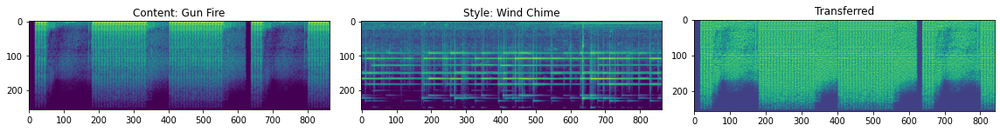

In [81]:
fig, ax = plt.subplots(nrows=1, ncols=3, figsize=(16, 4))

ax[0].imshow(read_audio_mel_spectum(CONTENT_FILENAME)[0])
ax[1].imshow(read_audio_mel_spectum(STYLE_FILENAME)[0])
ax[2].imshow(transferred[:,:840])

ax[0].set_title('Content: Gun Fire')
ax[1].set_title('Style: Wind Chime')
ax[2].set_title('Transferred')

fig.tight_layout()
plt.savefig('graphs/fire-wind_chime_mel.jpg')